<a href="https://colab.research.google.com/github/sandeepss2020/Computer_Vision/blob/main/CV_LAB4_IMAGE_PROCESSING.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Conversion from one color model to another

In [3]:
import cv2 
import numpy as np 
import pandas as pd
from matplotlib import pyplot as plt

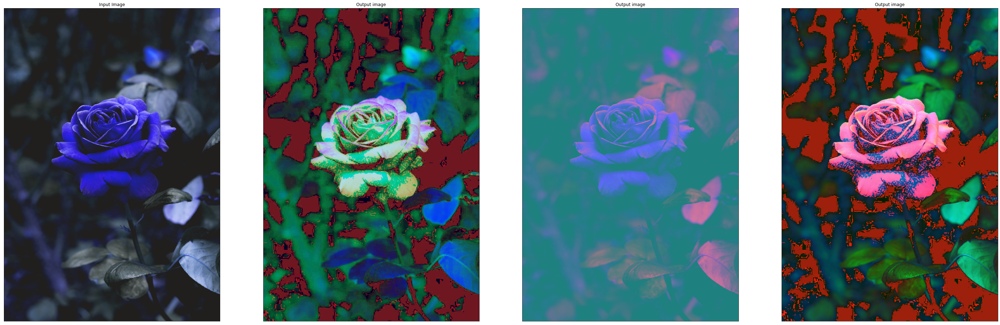

In [2]:

srcimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/rose3.jpg') 

plt.figure(figsize=(50, 50), constrained_layout=False)
BGR2HSV= cv2.cvtColor(srcimg,cv2.COLOR_BGR2HSV )

BGR2YUV=cv2.cvtColor(srcimg,cv2.COLOR_BGR2YUV )
#BGR2HLS=cv2.cvtColor(srcimg,cv2.COLOR_BGR2HLS )
BGR2YCrCb=cv2.cvtColor(srcimg,cv2.COLOR_BGR2HLS_FULL )

plt.subplot(141),plt.imshow(srcimg)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142),plt.imshow(BGR2HSV)
plt.title('Output image'), plt.xticks([]), plt.yticks([])
plt.subplot(143),plt.imshow(BGR2YUV)
plt.title('Output image'), plt.xticks([]), plt.yticks([])
plt.subplot(144),plt.imshow(BGR2YCrCb)
plt.title('Output image'), plt.xticks([]), plt.yticks([])
plt.show()


1) HSV (hue, saturation, value), also known as HSB (hue, saturation, brightness), is often used by artists because it is often more natural to think about a color in terms of hue and saturation than in terms of additive or subtractive color components. 

2) YUV is originally used in video: as human eyes have less resolution in its color perception,. Y refers to the luminance or intensity, and U/V channels represent color information

3) High-Level Synthesis(HLS)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


MEAN FILTER

(<matplotlib.axes._subplots.AxesSubplot at 0x7f49a9ad0e90>,
 Text(0.5, 1.0, 'ImageafterMean Filter'))

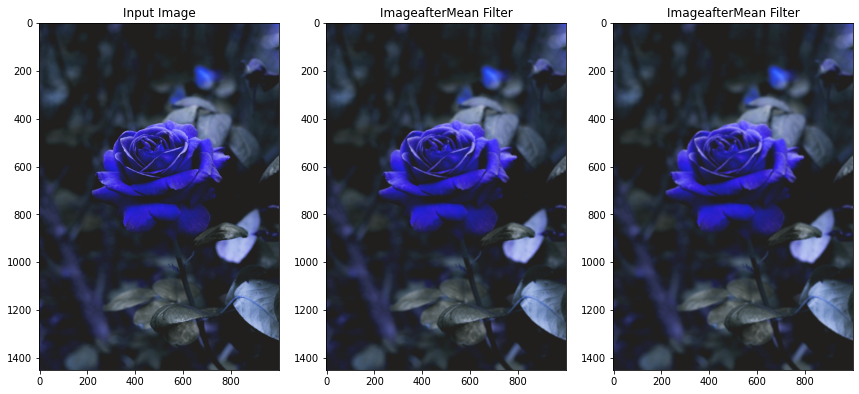

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/rose3.jpg',cv2.IMREAD_UNCHANGED)
kernel = np.ones((5,5),np.float32)/25
meanFilter = cv2.filter2D(img,-1,kernel)
#cv2.imshow("Mean Filtered Image",np.hstack((img, meanFilter)))

kernel2 = np.ones((7,7),np.float32)/49
meanFilter2 = cv2.filter2D(img,-1,kernel2)

plt.figure(figsize=(30, 30), constrained_layout=False)
plt.subplot(161), plt.imshow(img), plt.title("Input Image")
plt.subplot(162), plt.imshow(meanFilter), plt.title("ImageafterMean Filter")
plt.subplot(163), plt.imshow(meanFilter2), plt.title("ImageafterMean Filter")

# 3. Gaussian Blur (Gaussian smoothing)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9ed19dbd0>,
 Text(0.5, 1.0, 'ImageafterGaussianSmoothing2'))

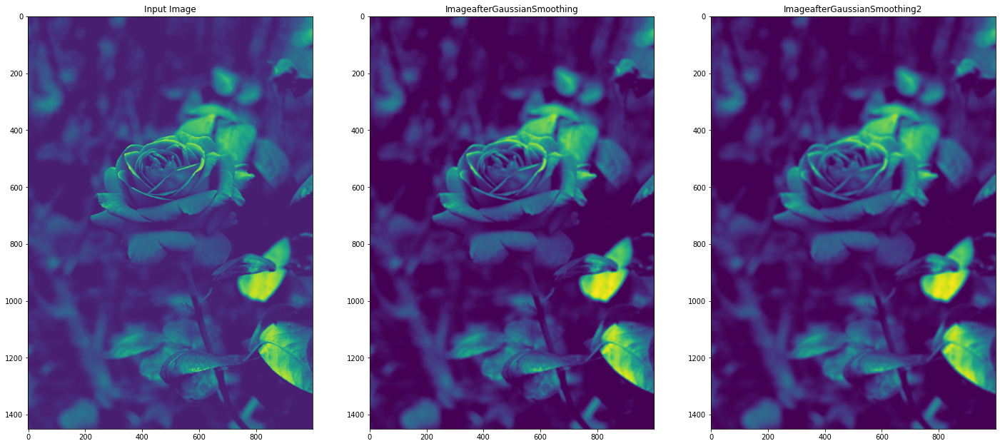

In [71]:
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/rose3.jpg')
oimg= cv2.cvtColor(oimg,cv2.COLOR_BGR2GRAY)
#ksize- Gaussian kernel size (width and height),
# the width and height can have different values and must be positive and odd,
gaussBlur =cv2.GaussianBlur(oimg,(7,7),cv2.BORDER_DEFAULT)

gaussBlur2 =cv2.GaussianBlur(oimg,(13,13),cv2.BORDER_DEFAULT)

plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(gaussBlur), plt.title("ImageafterGaussianSmoothing")
plt.subplot(163), plt.imshow(gaussBlur2), plt.title("ImageafterGaussianSmoothing2")



#4. High pass filter:

(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9f0554890>,
 Text(0.5, 1.0, 'High pass filtered Image'))

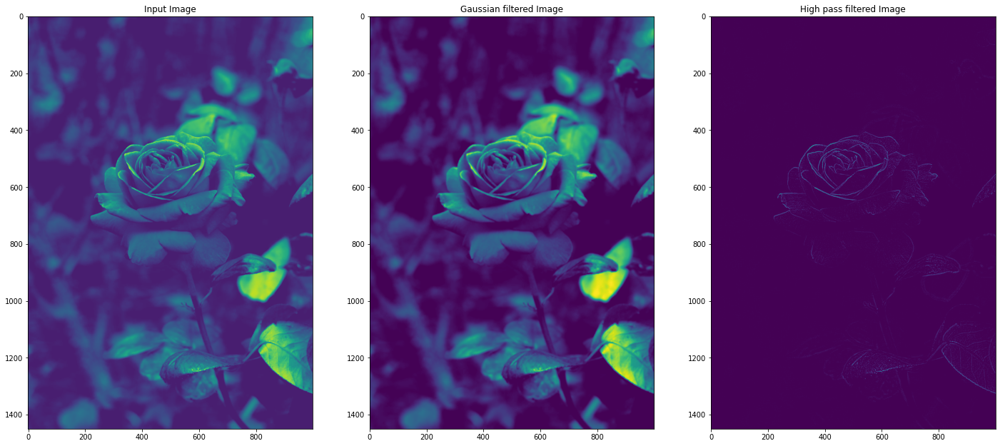

In [13]:
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/rose3.jpg',0)
gaussBlur =cv2.GaussianBlur(oimg,(5,5),cv2.BORDER_DEFAULT)
#cv2_imshow("Gaussian Smoothing",np.hstack((oimg,gaussBlur)))

plt.figure(figsize=(50,50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(gaussBlur), plt.title("Gaussian filtered Image")

hpf=cv2.subtract(oimg, gaussBlur)#oimg – gaussBlur
# or We can use this statement to filter the high pass image
#hpf = hpf + 127*np.ones(oimg.shape, np.uint8)
plt.subplot(163), plt.imshow(hpf), plt.title("High pass filtered Image")
#cv2.imshow("High Pass",np.hstack((img, highPass)))


# 5. lowpass filter:

(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9eda9abd0>,
 Text(0.5, 1.0, 'Image after Lowpass filter'))

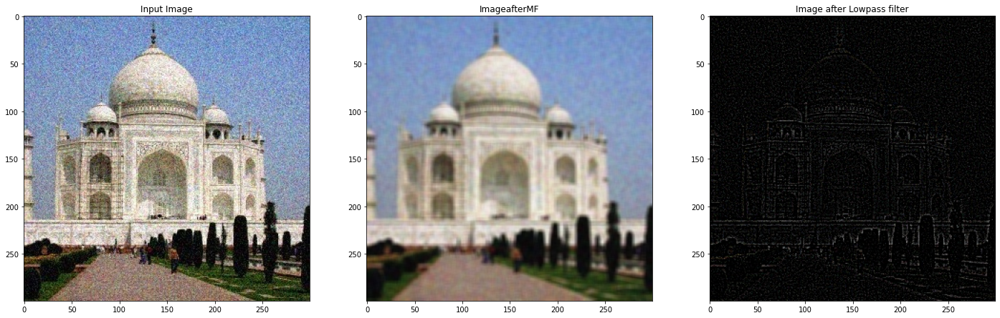

In [63]:
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')
oimg = cv2.cvtColor(oimg, cv2.COLOR_BGR2RGB)
kernel = np.ones((5,5),np.float32)/25
mf = cv2.filter2D(oimg,-1, kernel)      
lpf = cv2.subtract(oimg, mf)
plt.figure(figsize=(50,50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(mf), plt.title("ImageafterMF")
plt.subplot(163), plt.imshow(lpf), plt.title("Image after Lowpass filter")


DIFF BTW HPF AND LPF

(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9ecbe1710>,
 Text(0.5, 1.0, 'High pass filtered Image'))

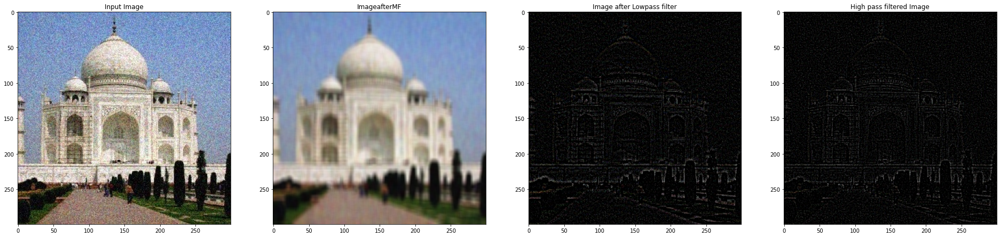

In [77]:
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')
oimg = cv2.cvtColor(oimg, cv2.COLOR_BGR2RGB)

gaussBlur =cv2.GaussianBlur(oimg,(5,5),cv2.BORDER_DEFAULT)      #FOR LPF
hpf=cv2.subtract(oimg, gaussBlur)

kernel = np.ones((9,5),np.float32)/45
mf = cv2.filter2D(oimg,-1, kernel)      
lpf = cv2.subtract(oimg, mf)
plt.figure(figsize=(50,50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(mf), plt.title("ImageafterMF")
plt.subplot(163), plt.imshow(lpf), plt.title("Image after Lowpass filter")
plt.subplot(164), plt.imshow(hpf), plt.title("High pass filtered Image")

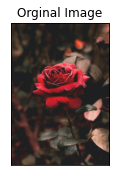

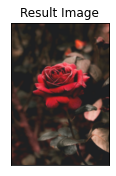

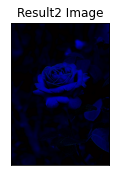

In [33]:
img_src = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/rose3.jpg')
img_src = cv2.cvtColor(img_src, cv2.COLOR_BGR2RGB)

#prepare the 5x5 shaped filter
# kernel = np.array([[1, 1, 1, 1, 1], 
#                    [1, 1, 1, 1, 1], 
#                    [1, 1, 1, 1, 1], 
#                    [1, 1, 1, 1, 1], 
#                    [1, 1, 1, 1, 1]])
# kernel = kernel/sum(kernel)

kernel = np.ones((9,9),np.float32)/81
mf = cv2.filter2D(img_src,-1, kernel)      
lpf = cv2.subtract(oimg, mf)
#filter the source image
plt.subplot(131)
plt.imshow(img_src)
plt.title('Orginal Image')
plt.xticks([])
plt.yticks([])
plt.show()

plt.subplot(132)
plt.imshow(mf)
plt.title('Result Image')
plt.xticks([])
plt.yticks([])
plt.show()


plt.subplot(132)
plt.imshow(lpf)
plt.title('Result2 Image')
plt.xticks([])
plt.yticks([])
plt.show()
#save result image
# cv2.imwrite('result.jpg',img_rst)

#6. Laplacian Filter

A Laplacian filter is an edge detector used to compute the second derivatives of an image. Instead of detecting edge in pixel. It direct detect the edges at once. the Laplacian edge detector uses only one kernel. It calculates second order derivatives in a single pass.

cv2.Laplacian(src, ddepth[, ksize])

src - input image
ddepth - Desired depth of the destination image.
ksize - kernel size

(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9eca545d0>,
 Text(0.5, 1.0, 'ImageafterLaplacianFilter'))

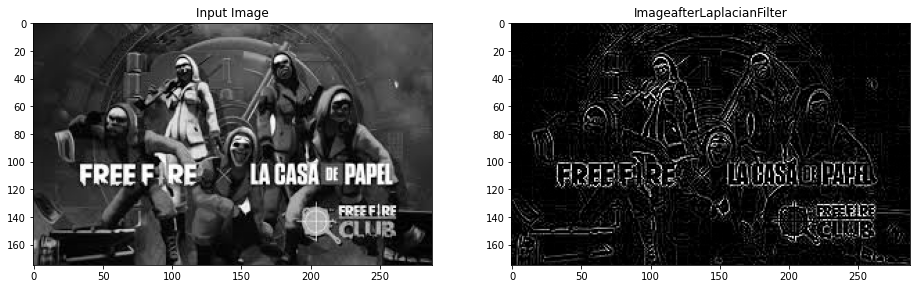

In [79]:
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg',0)
oimg = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
LaplacianFilter = cv2.Laplacian(oimg, 8, (5,5))

plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(LaplacianFilter), plt.title("ImageafterLaplacianFilter")


NON LINEAR FILTER --> We don't have mass coefficient i.e, the output pixel is not a combination of input pixels.

# 7. Median filter

In [40]:
# oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg',0)
# oimg = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
# MedianFilter = cv2.medianBlur(oimg,5)

# plt.figure(figsize=(50, 50), constrained_layout=False)
# plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
# plt.subplot(162), plt.imshow(MedianFilter), plt.title("ImageafterMedianFiltering")


# 8. Bilateral filter

Apply bilateral filter with d = 15,
sigmaColor = sigmaSpace = 75.
bilateral = cv2.bilateralFilter(img, 15, 75, 75)

sigmaColor: Value of \sigma  in the color space. The greater the value, the colors farther to each other will start to get mixed.

sigmaSpace: Value of \sigma  in the coordinate space. The greater its value, the more further pixels will mix together, given that their colors lie within the sigmaColor range.

In [44]:
# oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg',0)
# oimg = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
# bifilter = cv2.bilateralFilter(oimg,20,200,300)
# plt.figure(figsize=(50, 50), constrained_layout=False)
# plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
# plt.subplot(162), plt.imshow(bifilter), plt.title("ImageafterBilateral filtering")


# A bilateral filter is used for smoothening images and reducing noise, while preserving edges.

#9. Minimum and maximum filter

Salt and pepper noise: contains random occurrences of black and white pixels

 Impulse noise: contains random occurrences of white pixels

 Gaussian noise: variations in intensity drawn from a Gaussian normal distribution

In [58]:
# from PIL import Image, ImageFilter
   
# # creating a image object
# im1 = Image.open(r"/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg")
   
# # applying the min filter
# im2 = im1.filter(ImageFilter.MinFilter(size = 3))
# im3 = im1.filter(ImageFilter.MaxFilter(size = 3))

# import matplotlib.pyplot as plt
# plt.figure(figsize=(50, 50), constrained_layout=False)
# plt.subplot(161), plt.imshow(im1), plt.title("Input Image")
# plt.subplot(162), plt.imshow(im2), plt.title("ImageafterMinimum Filter")
# plt.subplot(163), plt.imshow(im3), plt.title("Imageafter MAX Filter")




(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9ec608310>,
 Text(0.5, 1.0, 'after biFilter'))

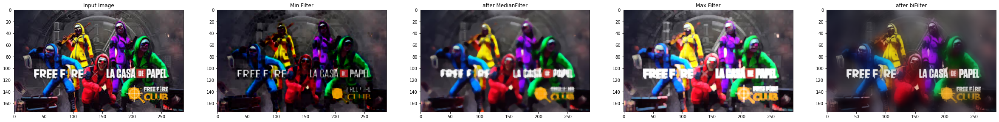

In [81]:
from PIL import Image, ImageFilter
   
# creating a image object
im1 = Image.open(r"/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg")
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/free_crim.jpg',1)
oimg = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
im2 = im1.filter(ImageFilter.MinFilter(size = 3))
im3 = im1.filter(ImageFilter.MaxFilter(size = 3))
MedianFilter = cv2.medianBlur(oimg,5)
bifilter = cv2.bilateralFilter(oimg,20,200,300)

plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(im2), plt.title("Min Filter")
plt.subplot(163), plt.imshow(MedianFilter), plt.title("after MedianFilter")
plt.subplot(164), plt.imshow(im3), plt.title("Max Filter")
plt.subplot(165), plt.imshow(bifilter), plt.title("after biFilter")


(<matplotlib.axes._subplots.AxesSubplot at 0x7fb9ed8c3590>,
 Text(0.5, 1.0, 'after biFilter'))

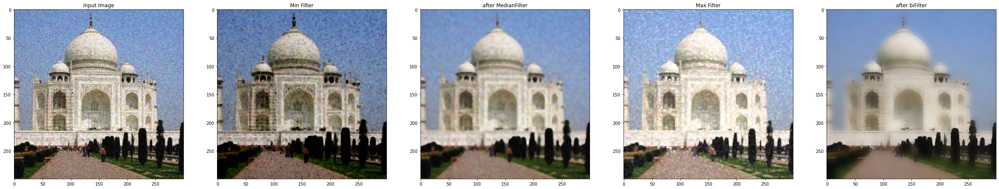

In [64]:
from PIL import Image, ImageFilter
   
# creating a image object
im1 = Image.open(r"/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg")
oimg = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer_Vision_dr/taj.jpg')
oimg = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
# LaplacianFilter = cv2.Laplacian(oimg, 24, (5,5))
im2 = im1.filter(ImageFilter.MinFilter(size = 3))
im3 = im1.filter(ImageFilter.MaxFilter(size = 3))
MedianFilter = cv2.medianBlur(oimg,5)
bifilter = cv2.bilateralFilter(oimg,20,200,300)

plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(im2), plt.title("Min Filter")
plt.subplot(163), plt.imshow(MedianFilter), plt.title("after MedianFilter")
plt.subplot(164), plt.imshow(im3), plt.title("Max Filter")
plt.subplot(165), plt.imshow(bifilter), plt.title("after biFilter")